# Latent Masked Test Overview

Straightforward notebook for inspecting the recent structured and auxiliary loss dynamics and evals on the base `LatentAttnMasked` attention model.

Here that behavior is built directly into the model class: setting `residual_mode="attention"` means the model uses only the learned linear latent backbone and does not activate the attention residual branch.

In [1]:
import importlib
from pathlib import Path

import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import display

import main
import models.registry
import models.train.loss
import models.train.lightning_module
import models.eval.evaluator
import models.architectures.latent_attention.latent_attn_masked

importlib.reload(models.train.loss)
importlib.reload(models.train.lightning_module)
importlib.reload(models.eval.evaluator)
importlib.reload(models.architectures.latent_attention.latent_attn_masked)
importlib.reload(models.registry)
importlib.reload(main)

from main import Sim
from models.architectures.utils import get_model_input

RESULTS_ROOT = Path("results/local_results")
RESULTS_ROOT.mkdir(parents=True, exist_ok=True)


### Define and train model

In [2]:
model_config = {
    "model": {
        "n_components_pca": 128,
        "residual_mode": "none",
        "residual_gain_init": 0.0,
        "reg": 1e-7,
    },
    "trainer": {
        "max_epochs": 100,
        "batch_size": 128,
        "lr": 1e-4,
        "loss_type": "composite",
        "loss_terms": [
            {"name": "mse", "weight": 1.0},
            {"name": "correye", "weight": 1.0},
            {"name": "neidist", "weight": 1.0},
        ],
        "loss_normalize": "ema",
        "loss_scale_ema_decay": 0.95,
        "loss_scale_warmup_steps": 20,
    },
}

sim = Sim(
    model_name="LatentAttnMasked",
    config_overrides=model_config,
    source="SC",
    target="FC",
    parcellation="Glasser",
    shuffle_seed=0,
    data_load_mode="precomputed",
)


/ext3/miniforge3/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3065: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/ext3/miniforge3/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3066: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


LatentAttnMasked prior-init | type=learned_cov_init | k=128 d_emb=32 attn_dim=32 num_heads=1 | C.shape=(128, 128) Wq.shape=(32, 32) Wk.shape=(32, 32) | scale=0.5 kernel_reg_weight=1.0 | rel_frob_error=9.680e-01
LatentAttnMasked init | src=SC tgt=FC | k=128 pls=16 | token_embedding_type=learned_cov_init token_embedding_dim=32 | residual_mode=attention_only residual_gain_init=0.0 | attn_dim=32 value_dim=32 | transformer_layers=0 num_heads=1 | readout_type=linear readout_hidden_dims=[16] | attention_activation=identity | zscore_pca_scores=False | mask_ratio=1.0 visible_fc_context=False | sc_token_dropout=0.0 | prior_qk_init_scale=0.5 prior_qk_kernel_reg_weight=1.0 prior_qk_rel_error=9.680e-01


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
/home/asr655/.local/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:881: Checkpoint directory /scratch/asr655/neuroinformatics/Conn2Conn/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name    | Type             | Params | Mode  | FLOPs
-------------------------------------------------------------
0 | model   | LatentAttnMasked | 11.4 K | train | 0    
1 | loss_fn | MSELoss          | 0      | train | 0    
---

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/asr655/.local/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/home/asr655/.local/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.



Training complete!


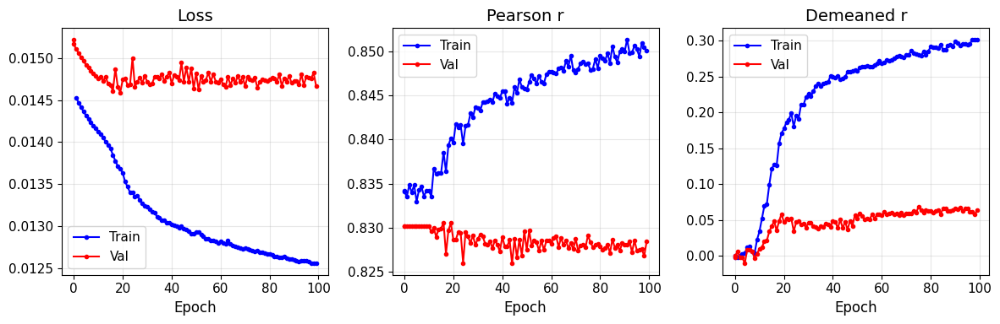

Number of unique demographic categories: 14


/scratch/asr655/neuroinformatics/Conn2Conn/models/eval/evaluator_viz_markdown.py:1190: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Top-1 accuracy: 0.051  (10 of 195 subjects had rank 1) (chance=0.005)
Average rank percentile: 0.651 (chance=0.5)


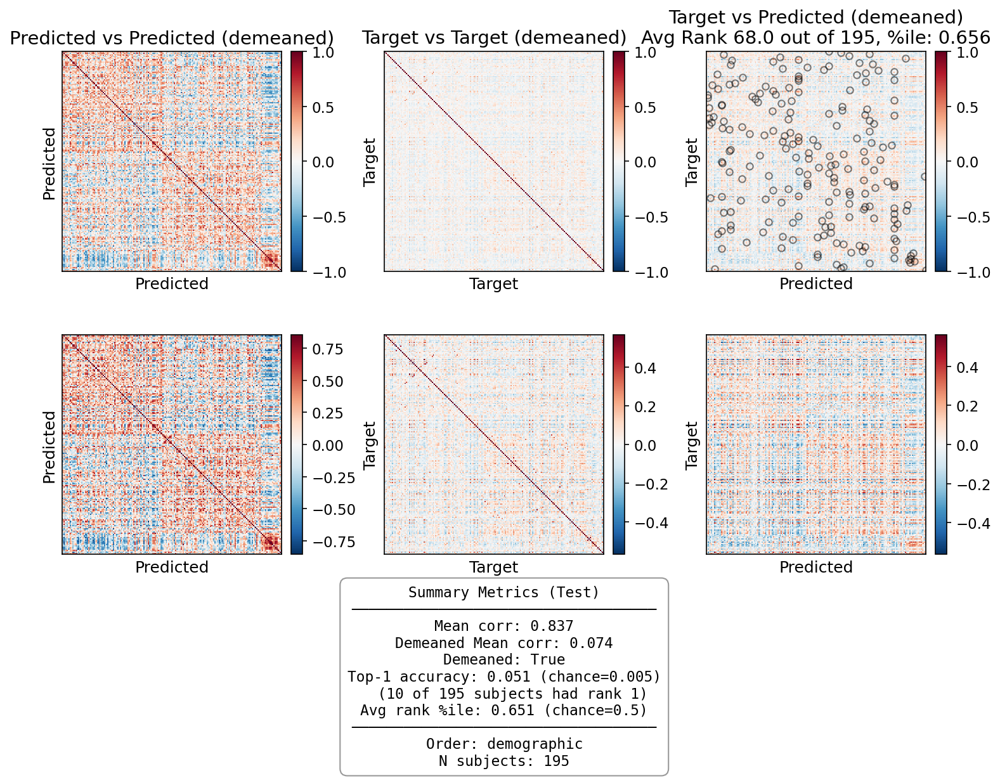

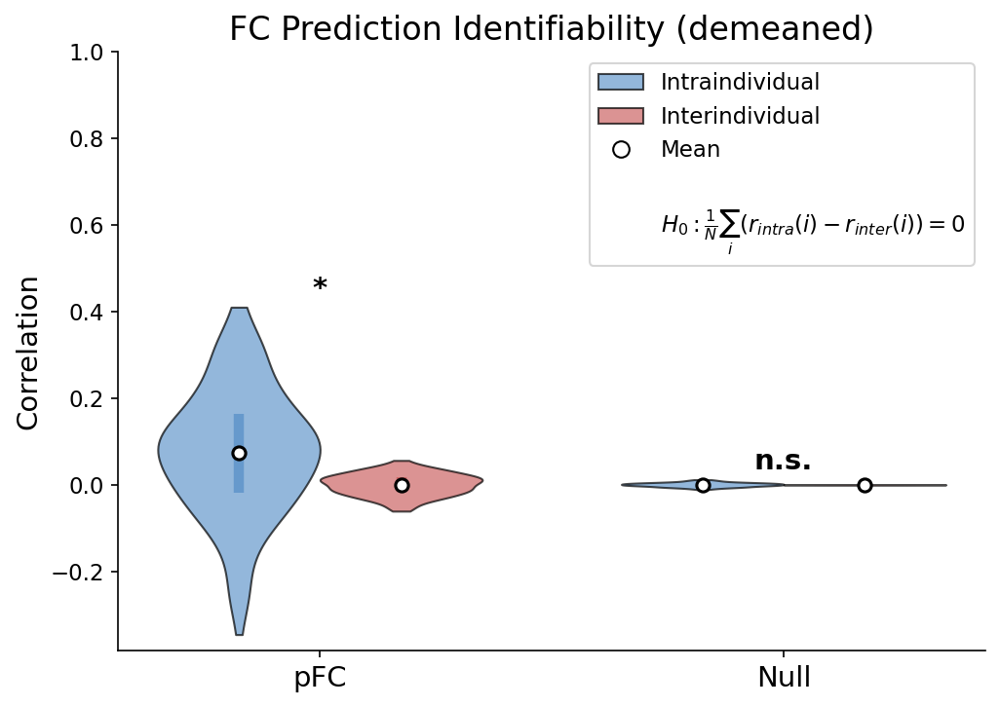


Identifiability Summary:
Condition    r_intra    r_inter    d          t          p            Cohen d   
----------------------------------------------------------------------
pFC          0.0736     0.0006     0.0731     6.97       4.89e-11     0.50      
Null         0.0004     -0.0001    0.0005     1.35       1.78e-01     0.10      


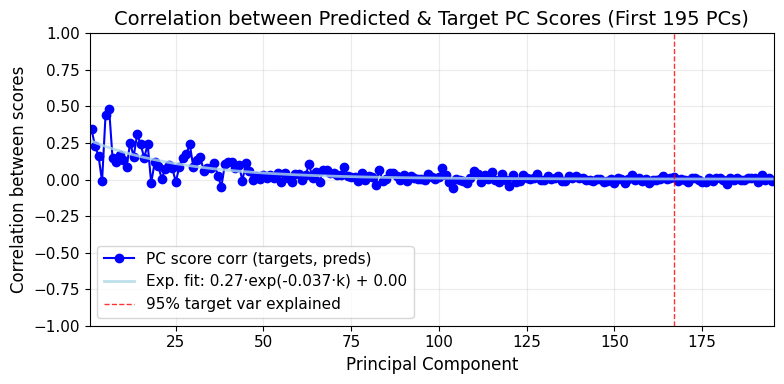

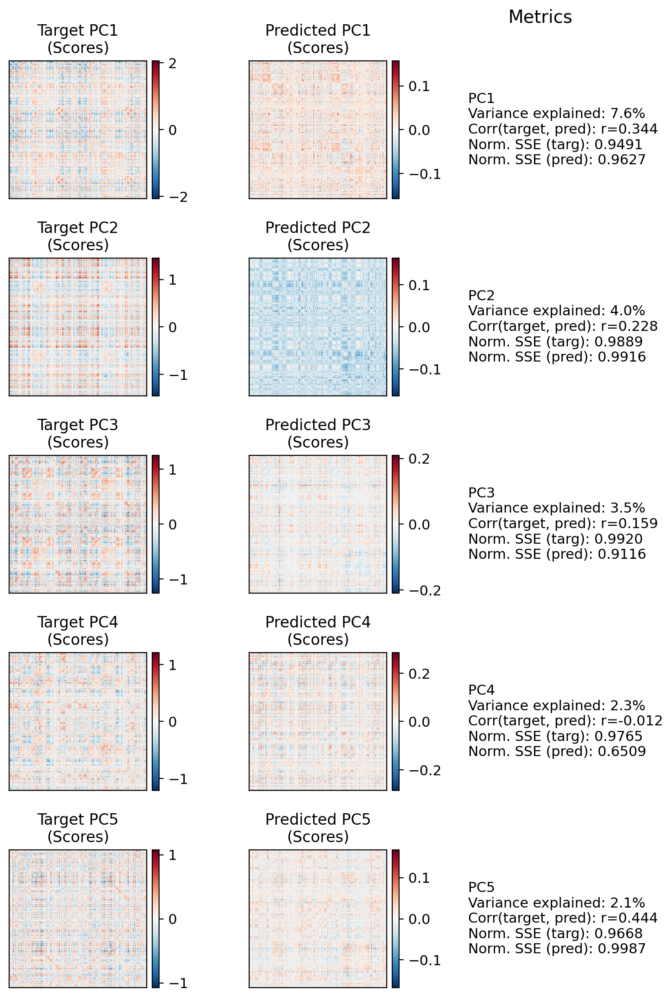

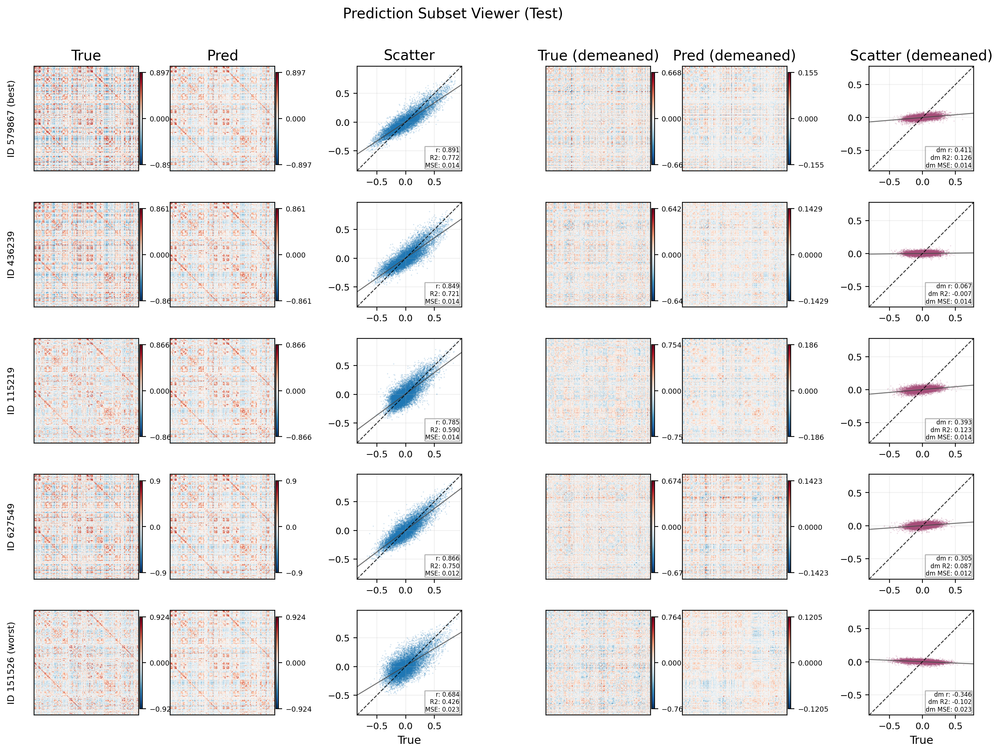

attention residual active: True


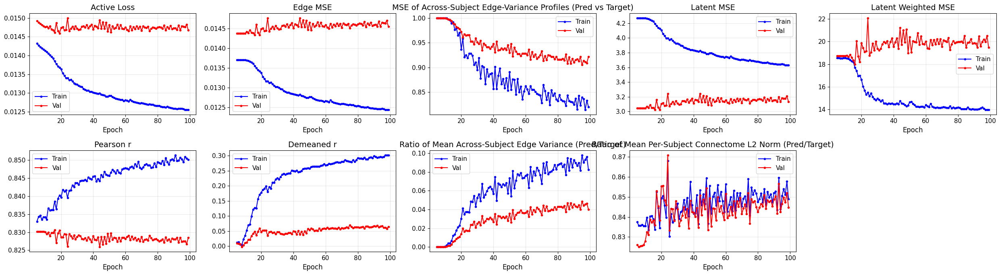

In [4]:
run_config = {
    "model": {
        "n_components_pca": 128,
        "zscore_pca_scores": False,
        "token_embedding_type": "learned_cov_init", # learned_cov_init     
        "prior_qk_init_scale": 0.5,
        "reg": 0.25,
        "token_embedding_dim": 32,
        "attn_dim": 32,
        "value_dim": 32,
        "transformer_layers": 0,
        "num_heads": 1,
        "attention_activation": "identity",
        "readout_type": "linear",
        "residual_mode": "attention_only",
        "train_use_visible_fc_context": False,
        "mask_ratio": 1.0, # 100-mask_ratio*100% of FC tokens visible
        "reg": 1e-7,
    },
    "trainer": {
        "max_epochs": 100,
        "batch_size": 128,
        "lr": 8.0e-3,
        "loss_type": "mse",
    },
}

run_out = sim.run_single(
    mode="dev",
    save_checkpoint=False,
    config_override=run_config,
    run_eval=True,
)

model_trained = run_out["model"]
model_trained.eval()
print("attention residual active:", model_trained.use_attention_residual)
run_out["test_metrics"]["base_metrics"]
run_out["train_result"].plot(style="latent", skip_first_n_epochs=5)

### Check linear backbone only 

In [ ]:
import torch
import numpy as np

val_batch = next(iter(sim.val_loader))
x_val = get_model_input(val_batch)
y_val = val_batch["y"]

with torch.no_grad():
    inspect_ex = model_trained.inspect_attention_state(x_val[:1], y=y_val[:1], force_all_masked=True)
    backbone_edges = model_trained.forward_backbone_only(x_val[:1]).detach().cpu().numpy()
    full_edges = model_trained(x_val[:1]).detach().cpu().numpy()

print("max |full - backbone_only|:", float(np.max(np.abs(full_edges - backbone_edges))))

base_ex = inspect_ex["c_target_base"].detach().cpu().squeeze(0).numpy()
delta_ex = inspect_ex["c_target_delta"].detach().cpu().squeeze(0).numpy()
final_ex = inspect_ex["c_target_hat"].detach().cpu().squeeze(0).numpy()

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

axes[0, 0].plot(base_ex, color="#64748b")
axes[0, 0].set_title("Pure linear backbone latent prediction")
axes[0, 0].set_xlabel("FC latent component")
axes[0, 0].grid(alpha=0.3)

axes[0, 1].plot(delta_ex, color="#2563eb")
axes[0, 1].set_title("Residual branch output after zero gain")
axes[0, 1].set_xlabel("FC latent component")
axes[0, 1].grid(alpha=0.3)

axes[1, 0].plot(final_ex, color="#0f766e")
axes[1, 0].set_title("Final latent prediction")
axes[1, 0].set_xlabel("FC latent component")
axes[1, 0].grid(alpha=0.3)

axes[1, 1].imshow(model_trained.residual_linear.weight.detach().cpu().numpy(), aspect="auto", cmap="coolwarm")
axes[1, 1].set_title("Learned linear backbone weight matrix")
axes[1, 1].set_xlabel("SC latent component")
axes[1, 1].set_ylabel("FC latent component")

plt.tight_layout()
plt.show()


## Math Summary

This notebook is the pure linear-backbone version of the model.
By construction, `residual_mode="none"` means there is **no** attention correction branch in the forward predictor.

The source latent vector is

$$
c_s \in \mathbb{R}^k.
$$

The model learns a single affine latent map

$$
c_{base} = W_{lin} c_s + b_{lin}.
$$

Because the attention residual path is disabled in this mode, the final predicted target latents are exactly

$$
\hat c_t = c_{base} = W_{lin} c_s + b_{lin}.
$$

The decoded FC prediction is then

$$
\hat y = \mu_t + P_t \hat c_t,
$$

where $P_t$ is the retained target PCA basis and $\mu_t$ is the target mean.

So this notebook should be interpreted as a pure multivariate linear latent regression model:
source edges are projected to SC latent coefficients, a learned linear map predicts FC latent coefficients, and those are decoded back to FC edge space.

The diagnostic quantity

$$
\max |f(x) - f_{backbone}(x)|
$$

should be numerically zero up to floating-point precision, confirming that the full model and the backbone-only path are the same in this mode.


### Optionally save outputs

In [ ]:
artifact_dir = RESULTS_ROOT / "test_structured_loss_model"
artifact_dir.mkdir(parents=True, exist_ok=True)
report_base = artifact_dir / "eval_test"

test_eval = run_out["evaluators"]["test"]
report_metrics = test_eval.analyze_results(
    verbose=False,
    filepath=str(report_base),
    output_format="md",
    model_name="LatentAttnMasked_structured_linear_backbone",
)

print(f"Markdown report saved to: {report_base}.md")
report_metrics["base_metrics"]